# INSURANCE

Insurance is a means of protection from financial loss. It is a form of risk management, primarily used to hedge against the risk of a contingent or uncertain loss.

An entity which provides insurance is known as an insurer, an insurance company, an insurance carrier or an underwriter. A person or entity who buys insurance is known as a policyholder, while a person or entity covered under the policy is called an insured. Policyholder and insured are often used as but are not necessarily synonyms, as coverage can sometimes extend to additional insureds who did not buy the insurance. The insurance transaction involves the policyholder assuming a guaranteed, known, and relatively small loss in the form of a payment to the insurer (a premium) in exchange for the insurer's promise to compensate the insured in the event of a covered loss. The loss may or may not be financial, but it must be reducible to financial terms. Furthermore, it usually involves something in which the insured has an insurable interest established by ownership, possession, or pre-existing relationship.

The insured receives a contract, called the insurance policy, which details the conditions and circumstances under which the insurer will compensate the insured, or their designated beneficiary or assignee. The amount of money charged by the insurer to the policyholder for the coverage set forth in the insurance policy is called the premium. If the insured experiences a loss which is potentially covered by the insurance policy, the insured submits a claim to the insurer for processing by a claims adjuster. A mandatory out-of-pocket expense required by an insurance policy before an insurer will pay a claim is called a deductible (or if required by a health insurance policy, a copayment). The insurer may hedge its own risk by taking out reinsurance, whereby another insurance company agrees to carry some of the risks, especially if the primary insurer deems the risk too large for it to carry.

# Data Description

Problem Statement:
Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

# Loading The Data Set

In [ ]:
import pandas as pd
import numpy as np

path ='https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv'
df= pd.read_csv(path)


In [ ]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [ ]:
df.head().T

,0,1,2,3,4
months_as_customer,328,228,134,256,228
age,48,42,29,41,44
policy_number,521585,342868,687698,227811,367455
policy_bind_date,17-10-2014,27-06-2006,06-09-2000,25-05-1990,06-06-2014
policy_state,OH,IN,OH,IL,IL
policy_csl,250/500,250/500,100/300,250/500,500/1000
policy_deductable,1000,2000,2000,2000,1000
policy_annual_premium,1406.91,1197.22,1413.14,1415.74,1583.91
umbrella_limit,0,5000000,5000000,6000000,6000000
insured_zip,466132,468176,430632,608117,610706


In [ ]:
df.tail().T

,995,996,997,998,999
months_as_customer,3,285,130,458,456
age,38,41,34,62,60
policy_number,941851,186934,918516,533940,556080
policy_bind_date,16-07-1991,05-01-2014,17-02-2003,18-11-2011,11-11-1996
policy_state,OH,IL,OH,IL,OH
policy_csl,500/1000,100/300,250/500,500/1000,250/500
policy_deductable,1000,1000,500,2000,1000
policy_annual_premium,1310.8,1436.79,1383.49,1356.92,766.19
umbrella_limit,0,0,3000000,5000000,0
insured_zip,431289,608177,442797,441714,612260


In [ ]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

# Data Exploration

In [ ]:
cat_cols=df.select_dtypes([object])

for col in cat_cols.columns:
    print(col)
    print(df[col].value_counts())
    print('--------------------------------------------------------------------------')

policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
--------------------------------------------------------------------------
policy_state
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
--------------------------------------------------------------------------
policy_csl
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
--------------------------------------------------------------------------
insured_sex
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64
--------------------------------------------------------------------------
insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64
------------------

In [ ]:
# dropping this column which is having lot of missing values
df.drop('_c39',axis=1,inplace=True)

# we can drop certain columns which doesnt make any impact on our model building
df.drop(['policy_number','incident_location'],axis=1,inplace=True)

In [ ]:
# grouping numerical variables
num_vars = [y for y in df.columns if df[y].dtypes != 'O']
df[num_vars]

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
0,328,48,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,13020,52080,2004
1,228,42,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,780,3510,2007
2,134,29,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,3850,23100,2007
3,256,41,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720,2014
4,228,44,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,650,4550,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1000,1310.80,0,431289,0,0,20,1,0,1,87200,17440,8720,61040,2006
996,285,41,1000,1436.79,0,608177,70900,0,23,1,2,3,108480,18080,18080,72320,2015
997,130,34,500,1383.49,3000000,442797,35100,0,4,3,2,3,67500,7500,7500,52500,1996
998,458,62,2000,1356.92,5000000,441714,0,0,2,1,0,1,46980,5220,5220,36540,1998


In [ ]:
# checking the value_counts of the certain features having symbol ?
print(df['collision_type'].value_counts())
print(df['property_damage'].value_counts())
print(df['police_report_available'].value_counts())

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64
?      360
NO     338
YES    302
Name: property_damage, dtype: int64
?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


In [ ]:
# replacing the character ? with mean of the feature

df['collision_type']=df['collision_type'].replace(
    to_replace='?', 
    value='Rear Collision', 
    inplace=False, 
    limit=None, 
    regex=False, method='pad')
df['property_damage']=df['property_damage'].replace(
    to_replace='?', 
    value='No', 
    inplace=False, 
    limit=None, 
    regex=False, method='pad')
df['police_report_available']=df['police_report_available'].replace(
    to_replace='?', 
    value='No', 
    inplace=False, 
    limit=None, 
    regex=False, method='pad')

In [ ]:
# Rechecking the value_counts to se whether Changes are made or not

print(df['collision_type'].value_counts())
print(df['property_damage'].value_counts())
print(df['police_report_available'].value_counts())

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64
No     360
NO     338
YES    302
Name: property_damage, dtype: int64
No     343
NO     343
YES    314
Name: police_report_available, dtype: int64


In [ ]:
import datetime

df['policy_year'] = pd.to_datetime(df.policy_bind_date,format='%d-%m-%Y')
df['incident_year'] = pd.to_datetime(df.incident_date, format='%d-%m-%Y')
df['policy_year'] = df['policy_year'].dt.strftime('%Y')
df['incident_year'] = df['incident_year'].dt.strftime('%Y')

In [ ]:
df.drop(['policy_bind_date','incident_date','policy_year','incident_year'],axis=1,inplace=True)


# Checking for the Columns containing Null , Blank Or Empty Values

In [ ]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_cl

We can see that no null values are present except for Column ( _c39 ) which is completely blank

In [ ]:
# Dropping the irrelevant columns..

df.drop(columns=["_c39"], axis=1, inplace=True)

In [ ]:
#checking of the data types of the dataset
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                

Checking the presence of NULL BLANK or EMPTY VALUES through HeatMap

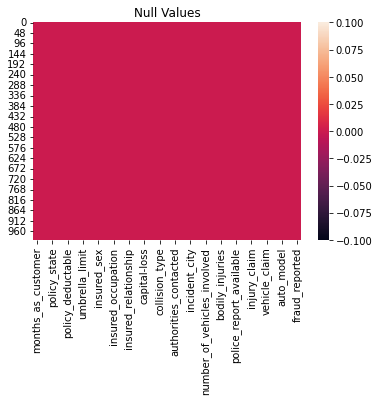

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

In [ ]:
df.describe(include=['O'])

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,3,3,2,7,14,20,6,4,3,4,5,7,7,3,3,14,39,2
top,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,No,No,Saab,RAM,N
freq,352,351,537,161,93,64,183,419,470,354,292,262,157,360,343,80,43,753


# Checking and Transforming the Data types of the Columns To Same DataTypes for Better Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   object 
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   object 
 9   insured_education_level      1000 non-null   object 
 10  insured_occupation           1000 non-null   object 
 11  insured_hobbies              1000 non-null   object 
 12  insured_relationship         1000 non-null   object 
 13  capital-gains      

In [ ]:
#checking of the data types of the dataset
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [ ]:
df.describe(include=['O']).T

,count,unique,top,freq
policy_bind_date,1000,951,01-01-2006,3
policy_state,1000,3,OH,352
policy_csl,1000,3,250/500,351
insured_sex,1000,2,FEMALE,537
insured_education_level,1000,7,JD,161
insured_occupation,1000,14,machine-op-inspct,93
insured_hobbies,1000,20,reading,64
insured_relationship,1000,6,own-child,183
incident_date,1000,60,02-02-2015,28
incident_type,1000,4,Multi-vehicle Collision,419


In [ ]:
from sklearn.preprocessing import LabelEncoder
le =LabelEncoder()

list1=['policy_state','policy_csl','insured_sex','insured_education_level','insured_occupation','insured_hobbies','insured_relationship','incident_type','collision_type','incident_severity','authorities_contacted','incident_state','incident_city','property_damage','police_report_available','auto_make','auto_model','fraud_reported']
for val in list1:
  df[val]=le.fit_transform(df[val].astype(str))

In [ ]:
df.head().T

,0,1,2,3,4
months_as_customer,328,228,134,256,228
age,48,42,29,41,44
policy_number,521585,342868,687698,227811,367455
policy_bind_date,17-10-2014,27-06-2006,06-09-2000,25-05-1990,06-06-2014
policy_state,2,1,2,0,0
policy_csl,1,1,0,1,2
policy_deductable,1000,2000,2000,2000,1000
policy_annual_premium,1406.91,1197.22,1413.14,1415.74,1583.91
umbrella_limit,0,5000000,5000000,6000000,6000000
insured_zip,466132,468176,430632,608117,610706


# Exploratory Data Analysis

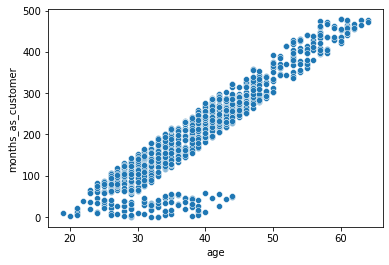

In [ ]:
import seaborn as sns
sns.scatterplot(x="age",y="months_as_customer",data=df)

* According to analysis, we have insured person of the age from 19 to 62 partnered with Banker for a minimum of 0 months to maximum of 500 months

* So there are more number of Genuine cases who claim insurance and the months as a customer will gradually increases with the age of the insured suggesting that the insured is a Genuine customer & will not make any fraud claims

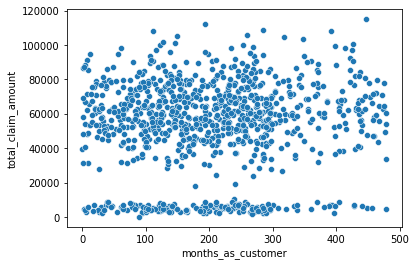

In [ ]:
sns.scatterplot(x="months_as_customer",y="total_claim_amount",data=df)

* The total_claim_amount claimed by the insurer as a customer ranges from 40000 to 10000 which includes both fraud as well as genuine customers. Another observation is that many of the Genuine customer as not yet claimed any amount but still pays to banker to be insured.

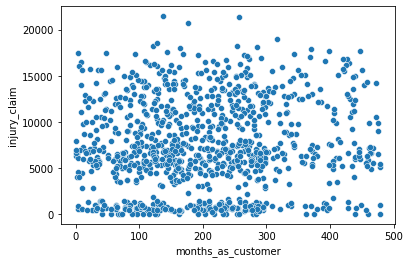

In [ ]:
sns.scatterplot(x="months_as_customer",y="injury_claim",data=df)

* If you like to see the age of the insured who has claimed injury claim, the figures is in the range 5000 to 20000 which are potentially Genuine insurer. there are still considerable number of fraud claims also which will get rejected by the banker if they are found fraud

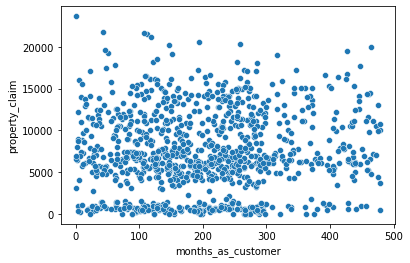

In [ ]:
sns.scatterplot(x="months_as_customer",y="property_claim",data=df)

* Property claims claimed by insurer ranges from 5000- 15000 in majority. and some minority genuine & fraud cases also claim beyond that

* Another observation from the plot is some of the genuine cases have not at all claimed property claim & wishes to be permanently insured customer

* Even the insurer have passed months of time with the current Insurer,they still be considered as fraud because of the fraudulant records

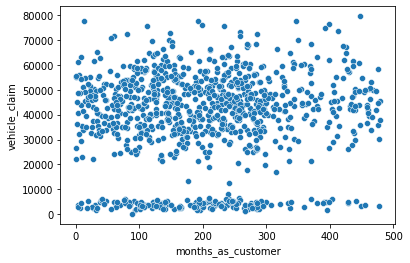

In [ ]:
sns.scatterplot(x="months_as_customer",y="vehicle_claim",data=df)

* Vehicle claims are claimemd from Rs 30000-70000 which includes both genuine & fraud cases. which will be clearly segregated later

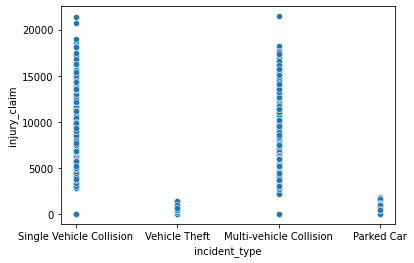

In [ ]:
sns.scatterplot(x="incident_type",y="injury_claim",data=df)

* Most of the fraud & genuine insurer claimed to be a victim of Single vehicle collision & Multi vehicle collision

* Vehicle theft are claimed in less numbers by insurer & all of them are genuine cases

* Claims amount ranges from 5000- 20000

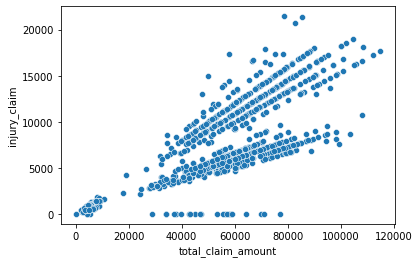

In [ ]:
sns.scatterplot(x="total_claim_amount",y="injury_claim",data=df)

* most of the injury claim is in the range of 5k-15k propbably it has added to the total_claim_amount. and has nothing to do with it for individual analysis

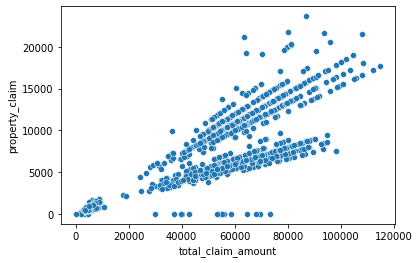

In [ ]:
sns.scatterplot(x="total_claim_amount",y="property_claim",data=df)

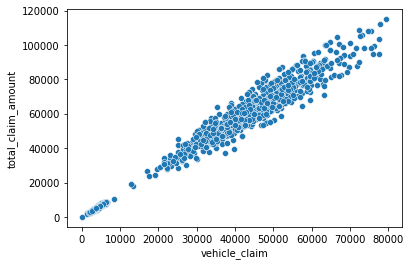

In [ ]:
sns.scatterplot(x="vehicle_claim",y="total_claim_amount",data=df)

* There are equally same number of Fraud & Genuine cases which are claimed to add up to total_claim_amount

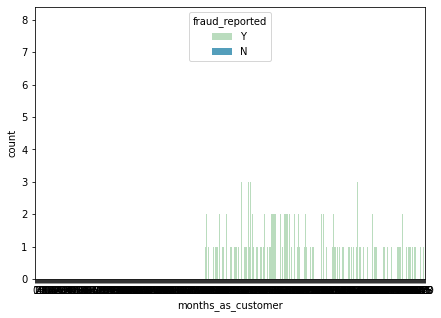

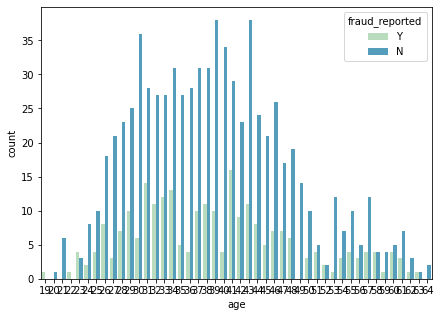

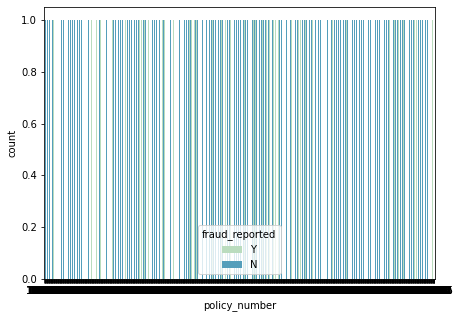

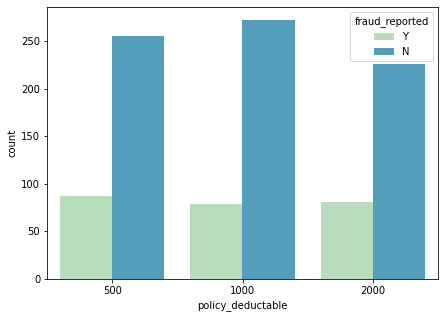

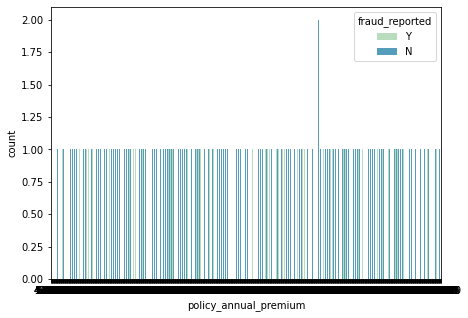

...

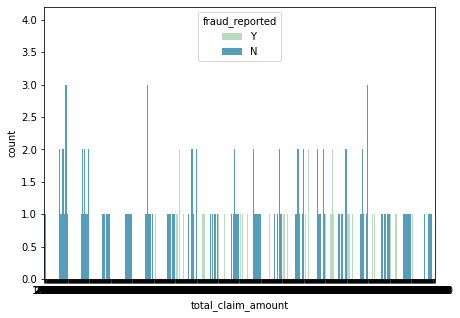

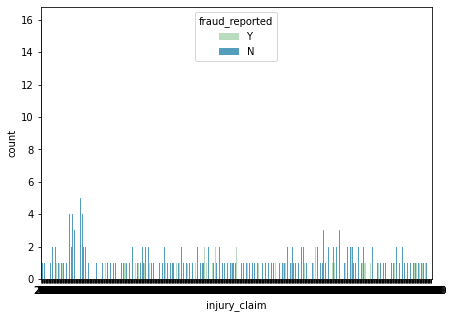

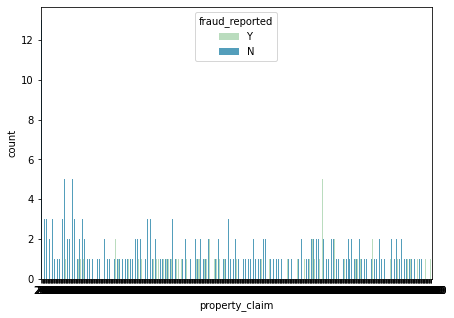

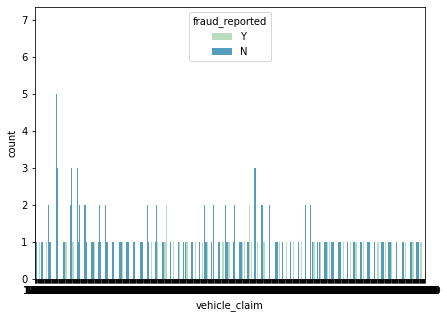

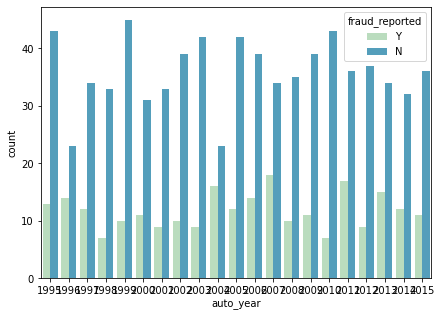

IndexError: ignored

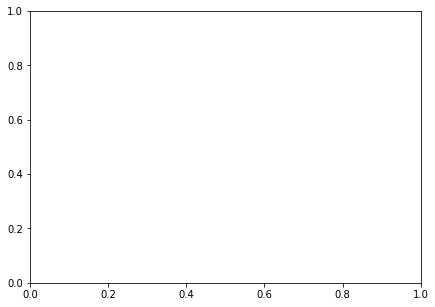

In [ ]:
# grouping numerical variables
num_vars = [y for y in df.columns if df[y].dtypes != 'O']
df[num_vars]


# plotting countplot

for i in num_vars:
    plt.figure(figsize=(7,5))
    sns.countplot(df[i],hue=df['fraud_reported'],palette='GnBu')
    plt.show()

# Observations

* There are more number of genuine customers than the fraudulant cases of age group of 19-62

* The deductible is the amount of money you pay before the insurer starts covering the cost of medical expenses . so deductable count is around 200 for each of the cases for non-fraudulant cases and it is 55-60 in counts for fraudulant cases

* An umbrella policy kicks in when you reach the limit on the underlying liability coverage in a homeowners, renters, condo or auto policy. so count is more for non-fraudulant cases than fraud one's

* Most of the incident has happened at 3 AM & 5 PM for genuine cases & most of the incident happened at 6 AM & 6 PM for fraud cases

* Most of the incidents has only one vehicle involved for fraudulant & genuine cases. next comes 3 vehicles

* Most of the body injuries has happened equally and there are no specific incident which caused injury to allover the body

* There are equal number of witnesses not more than 3 for an incident happened

* There are many vehicle claims,property claims and more in count for genuine cases

* Most of the Genuine cases incident happened 2005,2010,2012 as well as most of the fraud cases reported in the year 2004- 2007 & so on

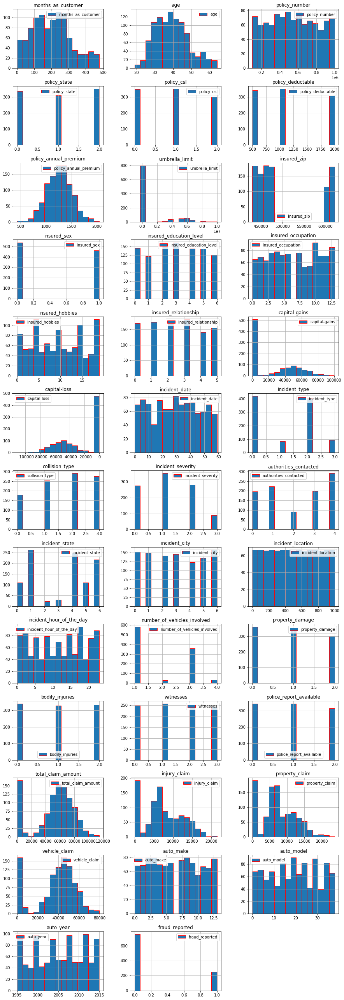

In [ ]:
df.hist(figsize=(15,50),edgecolor='red',layout=(14,3),bins=15,legend=True)
plt.show()

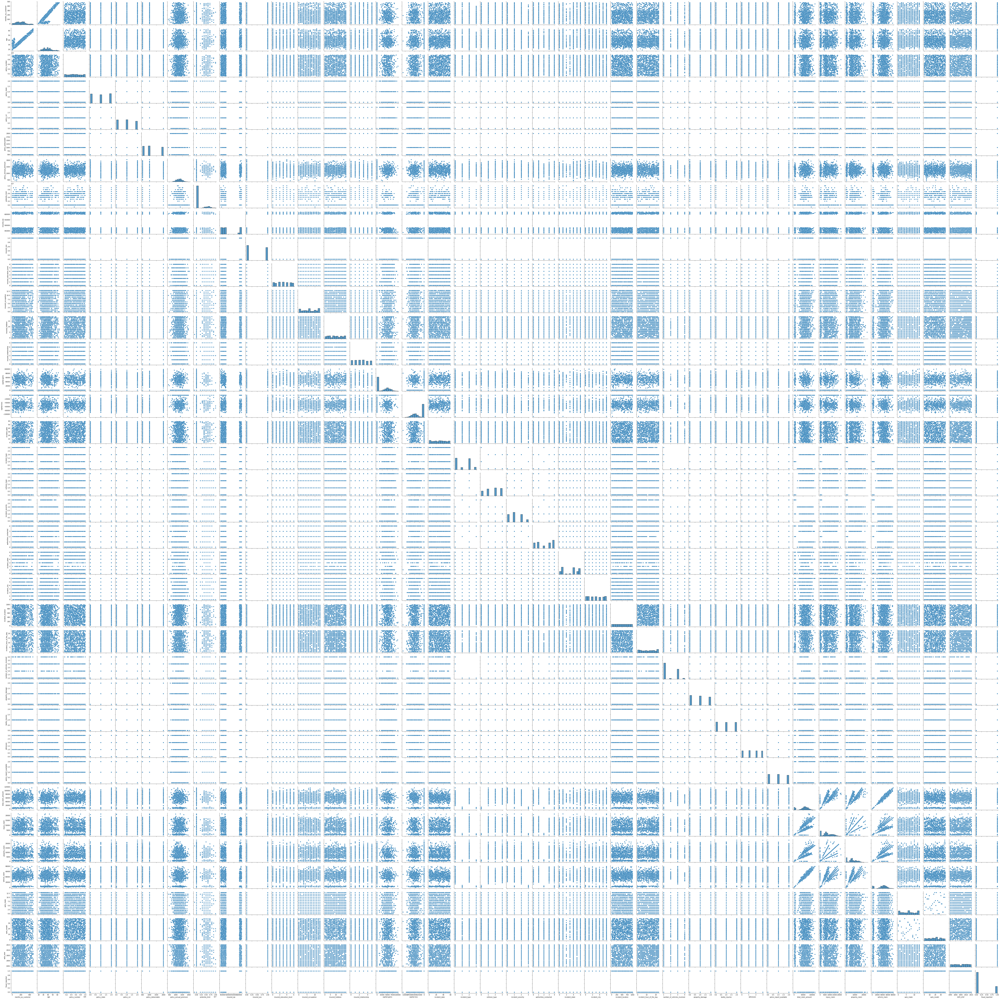

In [ ]:
sns.pairplot(df)

# Corealtion between features and target ' Fraud_Reported ' ( EDA )


In [ ]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,-0.000833,...,0.058383,-0.055712,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,0.000969,...,0.052359,-0.049797,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,-0.034327,...,0.022960,0.046682,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,0.009153,...,0.071500,-0.005252,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,0.015217,...,0.066639,0.035213,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,-0.019715,...,0.002332,0.024188,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,-0.019357,...,-0.006738,-0.021005,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622
insured_zip,0.017895,0.025604,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,0.016079,...,0.019805,0.034523,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,0.009002,...,0.042463,-0.008846,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.016079,0.009002,1.000000,...,0.019211,0.052622,0.074226,0.081880,0.055794,0.068348,0.055202,0.049445,0.043509,0.008808


In [ ]:
# Coorelation with the Target Column Primary Fuel 

df.corr()['fraud_reported'].sort_values()

incident_severity             -0.405988
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.049610
authorities_contacted         -0.045802
incident_city                 -0.040403
policy_csl                    -0.037190
auto_make                     -0.027519
police_report_available       -0.019571
capital-gains                 -0.019173
collision_type                -0.017315
capital-loss                  -0.014863
policy_annual_premium         -0.014480
auto_model                     0.000720
incident_hour_of_the_day       0.004316
auto_year                      0.007928
insured_education_level        0.008808
age                            0.012143
policy_deductable              0.014817
insured_zip                    0.019368
months_as_customer             0.020544
insured_relationship           0.021043
policy_state                   0.029432
insured_sex                    0.030873
bodily_injuries                0.033877


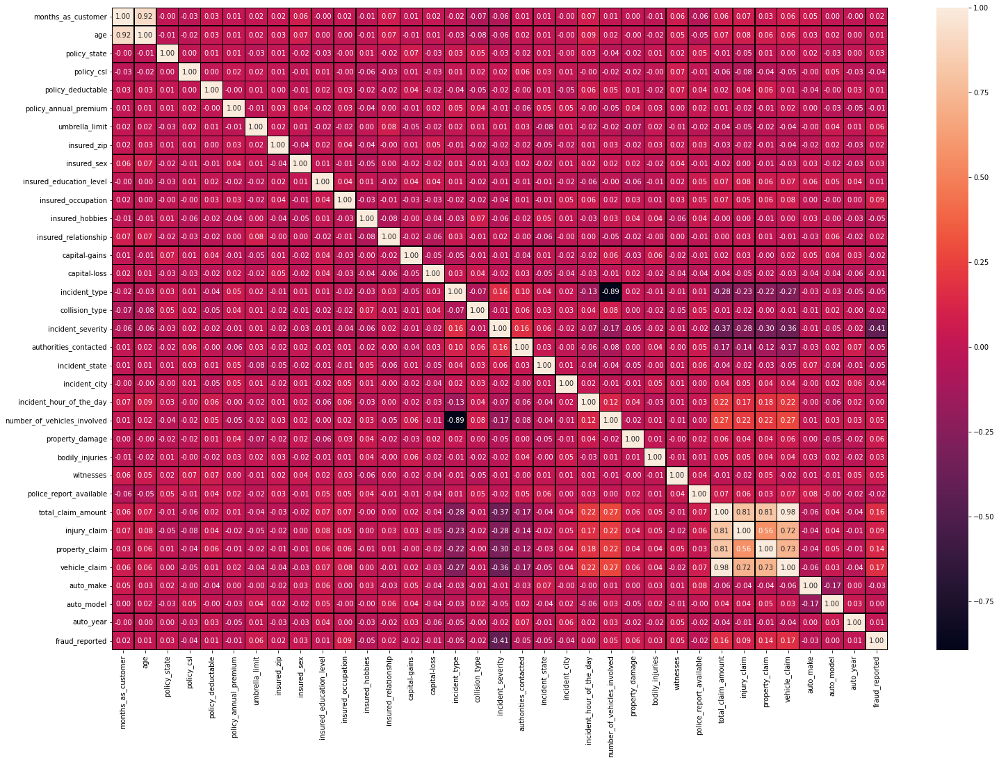

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(25,17))
sns.heatmap(df.corr(), annot=True, linewidths=0.5,linecolor="black", fmt='.2f')

# Descriptive Statistics

In [ ]:
df.describe()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1.01400,0.951000,1136.000000,1256.406150,1.101000e+06,501214.488000,0.463000,2.966000,...,1.487000,0.971000,52761.94000,7433.420000,7399.570000,37928.950000,6.546000,19.318000,2005.103000,0.247000
std,115.113174,9.140287,0.83096,0.804516,611.864673,244.167395,2.297407e+06,71701.610941,0.498879,1.948497,...,1.111335,0.810442,26401.53319,4880.951853,4824.726179,18886.252893,4.034869,11.136107,6.015861,0.431483
min,0.000000,19.000000,0.00000,0.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,0.000000,...,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000
25%,115.750000,32.000000,0.00000,0.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,1.000000,...,1.000000,0.000000,41812.50000,4295.000000,4445.000000,30292.500000,3.000000,10.000000,2000.000000,0.000000
50%,199.500000,38.000000,1.00000,1.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,3.000000,...,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,7.000000,20.000000,2005.000000,0.000000
75%,276.250000,44.000000,2.00000,2.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,1.000000,5.000000,...,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,10.000000,29.000000,2010.000000,0.000000
max,479.000000,64.000000,2.00000,2.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,1.000000,6.000000,...,3.000000,2.000000,114920.00000,21450.000000,23670.000000,79560.000000,13.000000,38.000000,2015.000000,1.000000


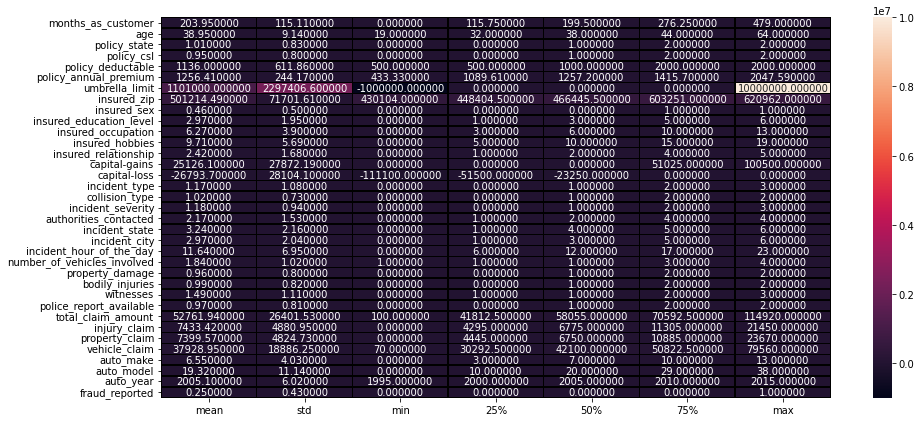

In [ ]:
plt.figure(figsize=(15,7))
sns.heatmap(round(df.describe()[1:].transpose(),2), annot=True, linewidths=0.5,linecolor="black", fmt='f')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   int64  
 3   policy_csl                   1000 non-null   int64  
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   int64  
 9   insured_education_level      1000 non-null   int64  
 10  insured_occupation           1000 non-null   int64  
 11  insured_hobbies              1000 non-null   int64  
 12  insured_relationship         1000 non-null   int64  
 13  capital-gains      

# Checking Data To Remove Skewness

In [ ]:
df.iloc[:,:-1].skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation             0.054737
insured_hobbies               -0.067204
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.064799
bodily_injuries                0.014777


In [ ]:
from sklearn.preprocessing import power_transform
x_new=power_transform(df.iloc[:,:-1],method='yeo-johnson')

df.iloc[:,:-1]=pd.DataFrame(x_new,columns=df.iloc[:,:-1].columns)

In [ ]:
df.iloc[:,:-1].skew()

months_as_customer             0.001473
age                            0.002109
policy_state                  -0.043608
policy_csl                    -0.007389
policy_deductable              0.019223
policy_annual_premium          0.003458
umbrella_limit                -1.780083
insured_zip                    0.000000
insured_sex                    0.148630
insured_education_level       -0.031972
insured_occupation            -0.044001
insured_hobbies               -0.041535
insured_relationship          -0.030775
capital-gains                  0.038033
capital-loss                   0.087448
incident_type                 -0.034397
collision_type                -0.017894
incident_severity              0.003670
authorities_contacted         -0.086068
incident_state                -0.073077
incident_city                 -0.040815
incident_hour_of_the_day      -0.046872
number_of_vehicles_involved    0.341953
property_damage               -0.010165
bodily_injuries               -0.029061


# Outliers Checking

months_as_customer                AxesSubplot(0.125,0.657941;0.0503247x0.222059)
age                             AxesSubplot(0.18539,0.657941;0.0503247x0.222059)
policy_state                   AxesSubplot(0.245779,0.657941;0.0503247x0.222059)
policy_csl                     AxesSubplot(0.306169,0.657941;0.0503247x0.222059)
policy_deductable              AxesSubplot(0.366558,0.657941;0.0503247x0.222059)
policy_annual_premium          AxesSubplot(0.426948,0.657941;0.0503247x0.222059)
umbrella_limit                 AxesSubplot(0.487338,0.657941;0.0503247x0.222059)
insured_zip                    AxesSubplot(0.547727,0.657941;0.0503247x0.222059)
insured_sex                    AxesSubplot(0.608117,0.657941;0.0503247x0.222059)
insured_education_level        AxesSubplot(0.668506,0.657941;0.0503247x0.222059)
insured_occupation             AxesSubplot(0.728896,0.657941;0.0503247x0.222059)
insured_hobbies                AxesSubplot(0.789286,0.657941;0.0503247x0.222059)
insured_relationship        

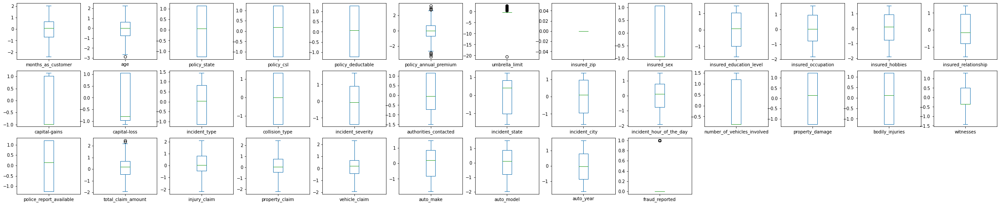

In [ ]:
import warnings
warnings.filterwarnings('ignore')
df.plot(kind='box',subplots=True, layout=(3,13), figsize=[40,8])

# IQR Proximity Rule
Z - Score Technique

In [ ]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
z.shape

(1000, 35)

In [ ]:
threshold=3
print(np.where(z>3))

(array([229, 248, 290, 763]), array([5, 5, 6, 5]))


In [ ]:
len(np.where(z>3)[0])

4

In [ ]:
df.drop([229, 248, 290, 763],axis=0)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,1.051279,1.008733,1.146048,0.178846,0.067784,0.616676,-0.349113,0.0,1.076953,0.568665,...,0.517616,1.207630,0.715714,0.005762,1.081793,0.753697,0.859111,-1.808345,-0.197455,1
1,0.304536,0.431433,0.071806,0.178846,1.271863,-0.242577,1.357817,0.0,1.076953,0.568665,...,-1.410682,0.143401,-1.776979,-1.525347,-1.557391,-1.786629,0.418616,-0.586225,0.302622,1
2,-0.511226,-1.139513,1.146048,-1.237596,1.271863,0.642206,1.357817,0.0,-0.928546,1.462749,...,1.290743,-1.248928,-0.716825,0.223833,-0.577507,-0.820881,-0.555149,0.944905,0.302622,0
3,0.523344,0.327852,-1.259374,0.178846,1.271863,0.652860,1.644005,0.0,-0.928546,1.462749,...,0.517616,-1.248928,0.391426,-0.026762,-0.034793,0.677602,-0.828189,1.252785,1.497810,1
4,0.304536,0.631918,-1.259374,1.230487,0.067784,1.342030,1.644005,0.0,1.076953,-1.631894,...,-0.355794,-1.248928,-1.729802,-1.304154,-1.622102,-1.740038,-1.809810,1.022679,0.640027,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.287530,0.002457,1.146048,1.230487,0.067784,0.222833,-0.349113,0.0,-0.928546,1.025429,...,-0.355794,0.143401,1.338829,1.638435,0.403281,1.259186,-0.049272,-1.194088,0.135129,0
996,0.741446,0.327852,-1.259374,-1.237596,0.067784,0.739122,-0.349113,0.0,-0.928546,1.462749,...,1.290743,0.143401,2.202447,1.717091,1.767003,1.904757,1.481528,0.787622,1.671841,0
997,-0.549706,-0.470444,1.146048,0.178846,-1.211269,0.520703,0.756509,0.0,-0.928546,1.025429,...,1.290743,1.207630,0.553012,0.188267,0.186095,0.777232,1.071136,0.045463,-1.496278,0
998,1.912654,2.130554,-1.259374,1.230487,1.271863,0.411823,1.357817,0.0,1.076953,-1.631894,...,-0.355794,1.207630,-0.247520,-0.251353,-0.265012,-0.104258,-1.440763,-1.305341,-1.176246,0


In [ ]:
df=df[(z<3).all(axis=1)]

In [ ]:
df.shape

(0, 35)

# Feature Engineering ( Variantion Inflation Factor )

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.891108,0.001688,-0.027577,0.015112,0.007832,0.001561,NaN,0.058731,-0.000908,...,0.056607,-0.056793,0.061277,0.061075,0.030372,0.059575,0.047862,0.005437,-0.001727,0.017018
age,0.891108,1.000000,-0.018118,-0.015911,0.019274,0.021160,0.008912,NaN,0.070414,0.003053,...,0.052907,-0.049077,0.065777,0.070976,0.056430,0.053764,0.026820,0.015537,0.002240,0.006137
policy_state,0.001688,-0.018118,1.000000,0.002192,0.007662,0.012429,-0.042022,NaN,-0.020352,-0.035326,...,0.023532,0.045012,-0.007459,-0.045993,0.008475,0.002437,0.016213,-0.025198,0.002734,0.029539
policy_csl,-0.027577,-0.015911,0.002192,1.000000,0.001378,0.024687,0.036666,NaN,-0.007511,0.007843,...,0.072251,-0.004253,-0.051279,-0.073491,-0.048142,-0.040715,-0.007002,0.048042,-0.032514,-0.035954
policy_deductable,0.015112,0.019274,0.007662,0.001378,1.000000,0.002131,0.021687,NaN,-0.012150,0.011341,...,0.075065,0.038092,0.017110,0.038433,0.050994,-0.005237,-0.030613,-0.003861,0.024608,0.006864
policy_annual_premium,0.007832,0.021160,0.012429,0.024687,0.002131,1.000000,-0.009938,NaN,0.038840,-0.019366,...,0.003270,0.024102,0.002511,-0.011482,-0.004283,0.016832,-0.000134,-0.031844,-0.048840,-0.014485
umbrella_limit,0.001561,0.008912,-0.042022,0.036666,0.021687,-0.009938,1.000000,NaN,-0.005004,0.004332,...,-0.000563,-0.019201,-0.061016,-0.040357,-0.048714,-0.060598,0.007886,0.028435,0.029582,0.060096
insured_zip,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
insured_sex,0.058731,0.070414,-0.020352,-0.007511,-0.012150,0.038840,-0.005004,NaN,1.000000,0.009667,...,0.043098,-0.009760,-0.029988,0.003951,-0.010271,-0.035805,0.026533,-0.018156,-0.029568,0.030873
insured_education_level,-0.000908,0.003053,-0.035326,0.007843,0.011341,-0.019366,0.004332,NaN,0.009667,1.000000,...,0.018485,0.053060,0.074435,0.085543,0.055614,0.065699,0.056148,0.049263,0.043485,0.008873


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5]), <a list of 35 Text major ticklabel objects>)

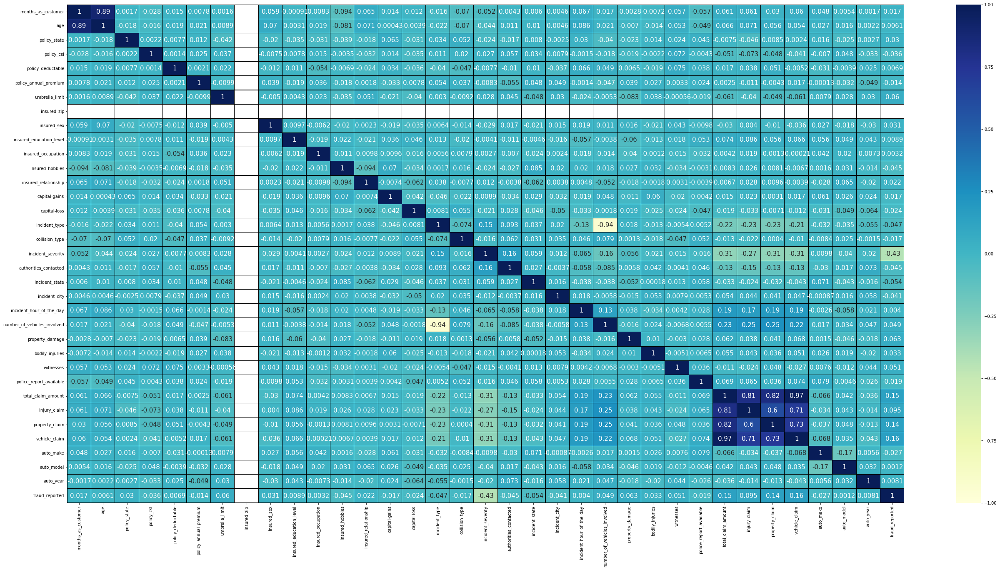

In [ ]:
plt.figure(figsize=(45,22))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.2g', annot = True, linecolor="black",annot_kws={'size':15},cmap="YlGnBu")
plt.yticks(rotation=0)

In [ ]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_cl

Splitting the dataset 

In [ ]:
x=df.drop('fraud_reported',axis=1)
y=df['fraud_reported']

In [ ]:
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.060250,1.008832,1.181444,0.120253,0.070718,0.616807,-0.414590,0.0,1.076953,0.531672,...,0.039672,0.478893,1.245336,0.686208,-0.110219,1.129063,0.735060,0.852207,-1.656393,-0.202238
1,0.275268,0.430668,-0.003947,0.120253,1.270132,-0.242355,1.544027,0.0,1.076953,0.531672,...,-1.224339,-1.365289,0.080308,-1.588869,-1.425781,-1.462896,-1.592401,0.359006,-0.651553,0.298174
2,-0.535246,-1.139146,1.181444,-1.211396,1.270132,0.642328,1.544027,0.0,-0.928546,1.546797,...,1.214647,1.338997,-1.220354,-0.796933,0.119530,-0.642441,-0.884542,-0.610459,0.956342,0.298174
3,0.501720,0.326994,-1.226760,0.120253,1.270132,0.652979,1.908962,0.0,-0.928546,1.546797,...,0.039672,0.478893,-1.220354,0.289538,-0.143197,-0.129425,0.637447,-0.855658,1.334872,1.503699
4,0.275268,0.631390,-1.226760,1.268561,0.070718,1.341826,1.908962,0.0,1.076953,-1.550336,...,-1.224339,-0.407529,-1.220354,-1.556544,-1.256739,-1.513766,-1.560844,-1.680260,1.050553,0.637371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.176642,0.001464,1.181444,1.268561,0.070718,0.223058,-0.414590,0.0,-0.928546,1.040262,...,-1.224339,-0.407529,0.080308,1.533373,1.892586,0.333923,1.426098,-0.128942,-1.170228,0.130223
996,0.730542,0.326994,-1.226760,-1.211396,0.070718,0.739210,-0.414590,0.0,-0.928546,1.546797,...,1.214647,1.338997,0.080308,2.863374,2.002769,2.006237,2.404883,1.592856,0.768897,1.680020
997,-0.572261,-0.471167,1.181444,0.120253,-1.212727,0.520864,0.805926,0.0,-0.928546,1.040262,...,1.214647,1.338997,1.245336,0.483053,0.081076,0.098490,0.765607,1.099250,-0.051159,-1.490567
998,2.000266,2.133579,-1.226760,1.268561,1.270132,0.412012,1.544027,0.0,1.076953,-1.550336,...,-1.224339,-0.407529,1.245336,-0.384257,-0.362386,-0.354115,-0.250595,-1.379022,-1.260728,-1.174235


In [ ]:
y

0      1
1      1
2      0
3      1
4      0
      ..
995    0
996    0
997    0
998    0
999    0
Name: fraud_reported, Length: 1000, dtype: int64

In [ ]:
def vif_calc():
  vif=pd.DataFrame()
  vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
  vif["features"]=x.columns
  print(vif)

In [ ]:
vif_calc()

    VIF Factor                     features
0     4.980489           months_as_customer
1     4.971968                          age
2     1.030609                 policy_state
3     1.026944                   policy_csl
4     1.034069            policy_deductable
5     1.027346        policy_annual_premium
6     1.027691               umbrella_limit
7     1.023657                  insured_sex
8     1.040023      insured_education_level
9     1.016161           insured_occupation
10    1.047223              insured_hobbies
11    1.038785         insured_relationship
12    1.032511                capital-gains
13    1.041940                 capital-loss
14    9.197637                incident_type
15    1.041538               collision_type
16    1.167007            incident_severity
17    1.078385        authorities_contacted
18    1.042592               incident_state
19    1.023145                incident_city
20    1.085913     incident_hour_of_the_day
21    9.299598  number_of_vehicl

In [ ]:
# Dropping the irrelevant columns..

x.drop(columns=["insured_zip","total_claim_amount"], axis=1, inplace=True)

# Scaling the Data

In [ ]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.060250,1.008832,1.181444,0.120253,0.070718,0.616807,-0.414590,1.076953,0.531672,-1.138194,...,1.269128,0.039672,0.478893,1.245336,-0.110219,1.129063,0.735060,0.852207,-1.656393,-0.202238
1,0.275268,0.430668,-0.003947,0.120253,1.270132,-0.242355,1.544027,1.076953,0.531672,-0.173458,...,0.089424,-1.224339,-1.365289,0.080308,-1.425781,-1.462896,-1.592401,0.359006,-0.651553,0.298174
2,-0.535246,-1.139146,1.181444,-1.211396,1.270132,0.642328,1.544027,-0.928546,1.546797,1.082735,...,-1.229199,1.214647,1.338997,-1.220354,0.119530,-0.642441,-0.884542,-0.610459,0.956342,0.298174
3,0.501720,0.326994,-1.226760,0.120253,1.270132,0.652979,1.908962,-0.928546,1.546797,-1.395781,...,0.089424,0.039672,0.478893,-1.220354,-0.143197,-0.129425,0.637447,-0.855658,1.334872,1.503699
4,0.275268,0.631390,-1.226760,1.268561,0.070718,1.341826,1.908962,1.076953,-1.550336,1.082735,...,-1.229199,-1.224339,-0.407529,-1.220354,-1.256739,-1.513766,-1.560844,-1.680260,1.050553,0.637371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.176642,0.001464,1.181444,1.268561,0.070718,0.223058,-0.414590,-0.928546,1.040262,-1.138194,...,1.269128,-1.224339,-0.407529,0.080308,1.892586,0.333923,1.426098,-0.128942,-1.170228,0.130223
996,0.730542,0.326994,-1.226760,-1.211396,0.070718,0.739210,-0.414590,-0.928546,1.546797,0.571829,...,1.269128,1.214647,1.338997,0.080308,2.002769,2.006237,2.404883,1.592856,0.768897,1.680020
997,-0.572261,-0.471167,1.181444,0.120253,-1.212727,0.520864,0.805926,-0.928546,1.040262,-1.395781,...,0.089424,1.214647,1.338997,1.245336,0.081076,0.098490,0.765607,1.099250,-0.051159,-1.490567
998,2.000266,2.133579,-1.226760,1.268561,1.270132,0.412012,1.544027,1.076953,-1.550336,-0.413279,...,0.089424,-1.224339,-0.407529,1.245336,-0.362386,-0.354115,-0.250595,-1.379022,-1.260728,-1.174235


# MODELLING FOR FRAUD_REPORT
# Building CLASSIFICATION Model As Target Column's Has only Two Outputs

0    753
1    247
Name: fraud_reported, dtype: int64


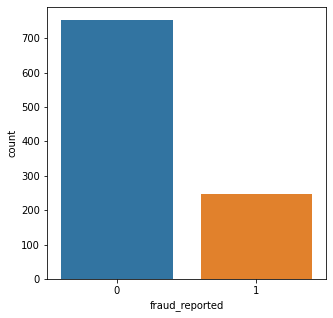

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

print(df['fraud_reported'].value_counts())  
plt.figure(figsize=(5,5))
sns.countplot(df['fraud_reported'])
plt.show()

# OverSampling

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x, y = sm.fit_resample(x,y)
y.value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

# Modelling
# Getting the best random state

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

maxAccu=0
maxRS=0

for i in range(1,200):
    x_train,x_test, y_train, y_test=train_test_split(x,y,test_size=.30, random_state=i)
    rfc=RandomForestClassifier()
    rfc.fit(x_train,y_train)
    pred=rfc.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu*100," on Random_state ",maxRS) 

Best accuracy is  91.1504424778761  on Random_state  8


In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# Logistic Regression

In [ ]:
# Checking Accuracy for Logistic Regression
log = LogisticRegression()
log.fit(x_train,y_train)

#Prediction
predlog = log.predict(x_test)

print(accuracy_score(y_test, predlog)*100)
print(confusion_matrix(y_test, predlog))
print(classification_report(y_test,predlog))

77.87610619469027
[[194  55]
 [ 45 158]]
              precision    recall  f1-score   support

           0       0.81      0.78      0.80       249
           1       0.74      0.78      0.76       203

    accuracy                           0.78       452
   macro avg       0.78      0.78      0.78       452
weighted avg       0.78      0.78      0.78       452



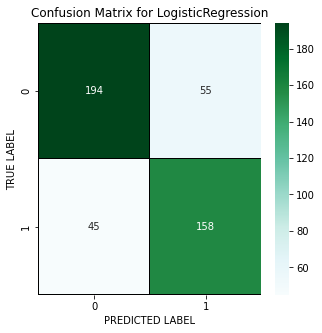

In [ ]:
# Plotting Confusion_Matrix
cm = confusion_matrix(y_test,predlog)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for LogisticRegression')
plt.show()

# Random Forest Classifier

In [ ]:
# Checking accuracy for Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

# Prediction
predrf = rf.predict(x_test)

print(accuracy_score(y_test, predrf)*100)
print(confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))

90.2654867256637
[[227  22]
 [ 22 181]]
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       249
           1       0.89      0.89      0.89       203

    accuracy                           0.90       452
   macro avg       0.90      0.90      0.90       452
weighted avg       0.90      0.90      0.90       452



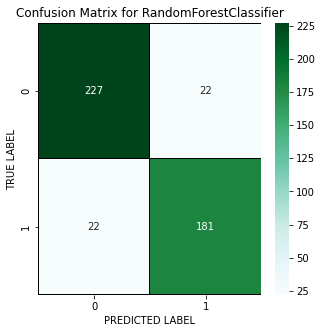

In [ ]:
# Lets plot confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predrf)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()


# Decission Tree Classifier

In [ ]:
# Checking Accuracy for Decision Tree Classifier
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)

#Prediction
preddtc = dtc.predict(x_test)

print(accuracy_score(y_test, preddtc)*100)
print(confusion_matrix(y_test, preddtc))
print(classification_report(y_test,preddtc))

85.17699115044249
[[207  42]
 [ 25 178]]
              precision    recall  f1-score   support

           0       0.89      0.83      0.86       249
           1       0.81      0.88      0.84       203

    accuracy                           0.85       452
   macro avg       0.85      0.85      0.85       452
weighted avg       0.85      0.85      0.85       452



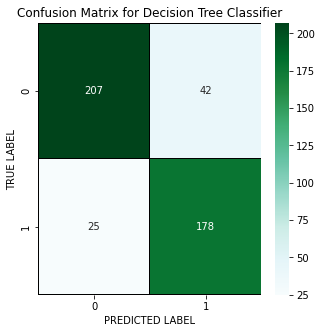

In [ ]:
# Lets plot confusion matrix for DTC
cm = confusion_matrix(y_test,preddtc)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

# Support Vector Machine Classifier

In [ ]:
# Checking accuracy for Support Vector Machine Classifier
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)

print(accuracy_score(y_test, predsvc)*100)
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

85.61946902654867
[[213  36]
 [ 29 174]]
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       249
           1       0.83      0.86      0.84       203

    accuracy                           0.86       452
   macro avg       0.85      0.86      0.86       452
weighted avg       0.86      0.86      0.86       452



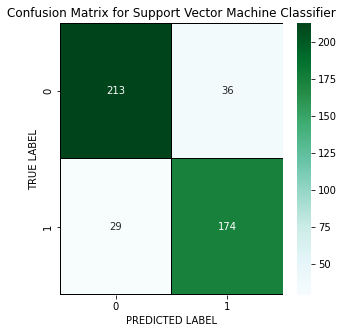

In [ ]:
# Lets plot confusion matrix for Support Vector Machine Classifier
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

# Gradient Boosting Classifier

In [ ]:
# Checking accuracy for Gradient Boosting Classifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

print(accuracy_score(y_test, predGB)*100)
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

90.48672566371681
[[224  25]
 [ 18 185]]
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       249
           1       0.88      0.91      0.90       203

    accuracy                           0.90       452
   macro avg       0.90      0.91      0.90       452
weighted avg       0.91      0.90      0.90       452



Text(0.5, 1.0, 'Confusion Matrix for Gradient Boosting Classifier')

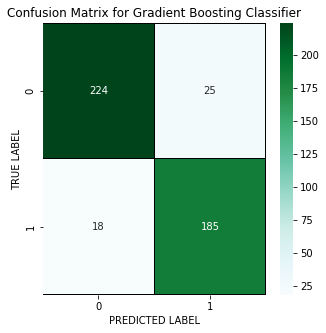

In [ ]:
# Lets plot confusion matrix for Gradient Boosting Classifier
cm = confusion_matrix(y_test,predGB)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')

# Cross Validation Score

In [ ]:
#cv score for Logistic Regression
print(cross_val_score(log,x,y,cv=5).mean()*100)

# cv score for Decision Tree Classifier
print(cross_val_score(dtc,x,y,cv=5).mean()*100)

# cv score for Random Forest Classifier
print(cross_val_score(rf,x,y,cv=5).mean()*100)

# cv score for Support Vector  Classifier
print(cross_val_score(svc,x,y,cv=5).mean()*100)

# cv score for Gradient Boosting Classifier
print(cross_val_score(GB,x,y,cv=5).mean()*100)

76.16224065477107
84.6678840949594
87.2605663241733
85.1297001166091
87.59015203185848


It is clear from the above that Random Forest Classifier is working the best with respect to Cross validation score as well which is minimum in the case..

So we move forward with Random Forest Classifier Model

# HyperParameter Tuning for the model with best score

In [ ]:
#Random Forest Classifier

parameters = {'criterion':['gini'],
             'max_features':['auto'],
             'n_estimators':[0,200],
             'max_depth':[2,3,4,5,6,8]}

In [ ]:
GCV=GridSearchCV(RandomForestClassifier(),parameters,cv=5)

In [ ]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini'], 'max_depth': [2, 3, 4, 5, 6, 8],
                         'max_features': ['auto'], 'n_estimators': [0, 200]})

In [ ]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 200}

In [ ]:
Insurance =RandomForestClassifier (criterion='gini', max_depth=8, max_features='auto', n_estimators=200)
Insurance.fit(x_train, y_train)
pred = Insurance.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

90.04424778761062


# Plotting ROC and compare AUC for the final model

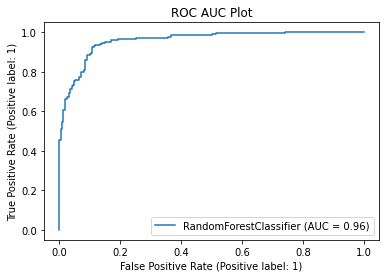

In [ ]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(Insurance,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

# Saving the model

In [ ]:
import joblib
joblib.dump(Insurance,"Census_Income.pkl")

['Census_Income.pkl']

# Conclusion:
# The accuracy score for Income is 96 %